# COVID19 CHest X-Ray Detector

### When using in Google Colab, mounts Google Drive to access the data

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd '/content/drive/My Drive/COVID_Chest_X_Ray_Data/COVID19-Data'

Mounted at /content/drive
[Errno 2] No such file or directory: '/content/drive/My Drive/COVID_Chest_X_Ray_Data/COVID19-Data'
/content


In [2]:
from google.colab import files
Pneumonia = files.upload()
Normal = files.upload()

Saving G_PC.zip to G_PC.zip


Saving G_NC.zip to G_NC.zip


In [3]:
!unzip "/content/G_NC.zip"

Streaming output truncated to the last 5000 lines.
  inflating: G1/15067.jpg            
  inflating: G1/15268.jpg            
  inflating: G1/15281.jpg            
  inflating: G1/15350.jpg            
  inflating: G1/15654.jpg            
  inflating: G1/16339.jpg            
  inflating: G1/69.jpg               
  inflating: G1/86.jpg               
  inflating: G1/120.jpg              
  inflating: G1/258.jpg              
  inflating: G1/744.jpg              
  inflating: G1/1126.jpg             
  inflating: G1/1228.jpg             
  inflating: G1/1252.jpg             
  inflating: G1/1381.jpg             
  inflating: G1/1559.jpg             
  inflating: G1/1747.jpg             
  inflating: G1/1806.jpg             
  inflating: G1/1874.jpg             
  inflating: G1/2072.jpg             
  inflating: G1/2712.jpg             
  inflating: G1/3032.jpg             
  inflating: G1/3222.jpg             
  inflating: G1/3242.jpg             
  inflating: G1/4076.jpg             

In [4]:
!unzip "/content/G_PC.zip"

Archive:  /content/G_PC.zip
   creating: G2/
  inflating: G2/21_g2.jpg            
  inflating: G2/53_g2.jpg            
  inflating: G2/58_g2.jpg            
  inflating: G2/70_g2.jpg            
  inflating: G2/77_g2.jpg            
  inflating: G2/96_g2.jpg            
  inflating: G2/114_g2.jpg           
  inflating: G2/122_g2.jpg           
  inflating: G2/127_g2.jpg           
  inflating: G2/129_g2.jpg           
  inflating: G2/146_g2.jpg           
  inflating: G2/161_g2.jpg           
  inflating: G2/176_g2.jpg           
  inflating: G2/202_g2.jpg           
  inflating: G2/233_g2.jpg           
  inflating: G2/272_g2.jpg           
  inflating: G2/297_g2.jpg           
  inflating: G2/374_g2.jpg           
  inflating: G2/393_g2.jpg           
  inflating: G2/419_g2.jpg           
  inflating: G2/448_g2.jpg           
  inflating: G2/504_g2.jpg           
  inflating: G2/513_g2.jpg           
  inflating: G2/523_g2.jpg           
  inflating: G2/530_g2.jpg           
  inf

### Importing all dependencies and libraries

In [2]:
from __future__ import print_function, division
from builtins import range, input

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model, load_model

from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.utils import to_categorical

from sklearn.metrics import classification_report

from sklearn.metrics import confusion_matrix, roc_curve
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt


from sklearn.model_selection import StratifiedKFold

from glob import glob
import pandas as pd

### Defines some model parameters

In [3]:
#define size to which images are to be resized
IMAGE_SIZE = [224, 224] # can be changed depending on the dataset

# training config:
epochs = 250
batch_size = 32

# define paths
# Pneumonia_path = '/content/drive/My Drive/COVID_Chest_X_Ray_Data/Chest_COVID'
# Normal_path = '/content/drive/My Drive/COVID_Chest_X_Ray_Data/Chest_NonCOVID'
Pneumonia_path = '/content/G2'
Normal_path = '/content/G1'
# Use glob to grab images from path .jpg or jpeg
Pneumonia_files = glob(Pneumonia_path + '/*')
Normal_files = glob(Normal_path + '/*')

In [7]:
# Data size for both of the labels

print(len(Pneumonia_files), len(Normal_files))

4758 16537


In [4]:
# Preparing Labels
Pneumonia_labels = []
Normal_labels = []

Pneumonia_images=[]
Normal_images=[]

import cv2 

for i in range(500):
  image = cv2.imread(Pneumonia_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  Pneumonia_images.append(image )
  Pneumonia_labels.append('Chest_Pneumonia')
  
for i in range(500):
  image = cv2.imread(Normal_files[i])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image = cv2.resize(image,(224,224))
  Normal_images.append(image )
  Normal_labels.append('Chest_Normal')




In [9]:
# # Preparing Labels
# Pneumonia_labels = []
# Normal_labels = []

# Pneumonia_images=[]
# Normal_images=[]

# import cv2 

# for i in range(len(Pneumonia_files)):
#   image = cv2.imread(Pneumonia_files[i])
#   image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#   image = cv2.resize(image,(224,224))
#   Pneumonia_images.append(image)
#   Pneumonia_labels.append('Chest_Pneumonia')
  
# for i in range(len(Normal_files)):
#   image = cv2.imread(noncovid_files[i])
#   image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#   image = cv2.resize(image,(224,224))
#   Normal_images.append(image)
#   Normal_labels.append('Chest_NonCOVID')

### Quick glimpse of the data set

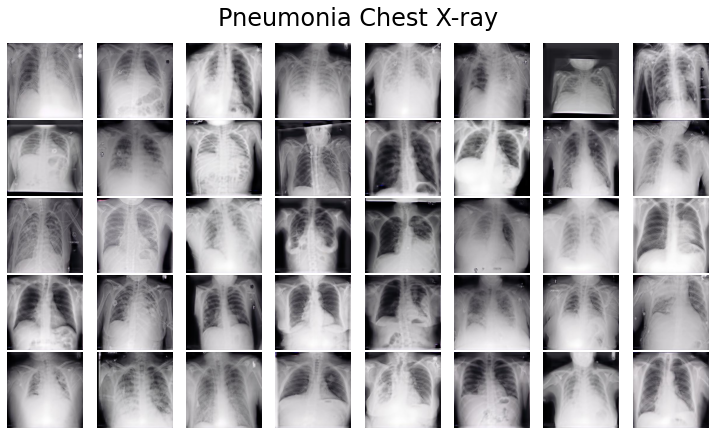

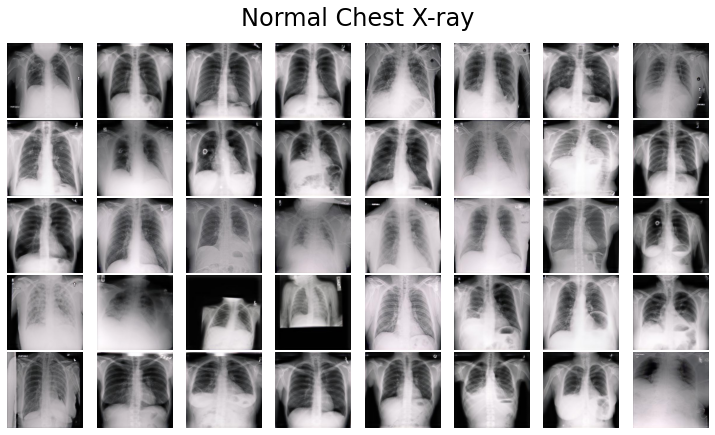

In [5]:
# look at a random image for fun
def plot_images(images, title):
    nrows, ncols = 5, 8
    figsize = [10, 6]

    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, facecolor=(1, 1, 1))

    for i, axi in enumerate(ax.flat):
        axi.imshow(images[i])
        axi.set_axis_off()

    plt.suptitle(title, fontsize=24)
    plt.tight_layout(pad=0.2, rect=[0, 0, 1, 0.9])
    plt.show()
plot_images(Pneumonia_images, 'Pneumonia Chest X-ray')
plot_images(Normal_images, 'Normal Chest X-ray')

In [6]:
# Convert to array and Normalize to interval of [0,1]
Pneumonia_images = np.array(Pneumonia_images) / 255


In [ ]:
# np.save('covid_images', covid_images)

In [12]:
len(Normal_images)

500

In [ ]:
# covid_images  = np.load("/content/covid_images.npy")

In [7]:
Normal_images

[array([[[12, 13, 15],
         [11, 13, 14],
         [11, 12, 14],
         ...,
         [10, 10, 10],
         [13, 13, 13],
         [15, 15, 15]],
 
        [[10, 11, 13],
         [ 9, 10, 12],
         [ 9, 10, 12],
         ...,
         [ 9,  9,  9],
         [11, 11, 11],
         [13, 13, 13]],
 
        [[ 8,  9, 11],
         [ 8,  9, 11],
         [ 8,  9, 11],
         ...,
         [ 7,  7,  7],
         [ 9,  9,  9],
         [10, 10, 10]],
 
        ...,
 
        [[ 9,  9, 11],
         [ 6,  6,  8],
         [ 5,  5,  7],
         ...,
         [13, 15, 15],
         [ 6, 11,  7],
         [18, 23, 19]],
 
        [[13, 13, 15],
         [11, 11, 13],
         [ 9,  9, 11],
         ...,
         [14, 15, 15],
         [11, 15, 12],
         [31, 36, 32]],
 
        [[17, 17, 19],
         [15, 15, 17],
         [12, 12, 14],
         ...,
         [25, 27, 27],
         [29, 34, 30],
         [62, 66, 62]]], dtype=uint8), array([[[174, 175, 170],
         [206, 20

In [8]:
Normal_images = np.array(Normal_images) / 255

### Split data set into training and testing

In [9]:
from sklearn.model_selection import KFold
inputs = np.concatenate((Pneumonia_images, Normal_images), axis=0)
targets = np.concatenate((Pneumonia_labels, Normal_labels), axis=0)

In [10]:
targets = LabelBinarizer().fit_transform(targets)
targets = to_categorical(targets)


In [17]:
# split into training and testing
Pneumonia_x_train, Pneumonia_x_test, Pneumonia_y_train, Pneumonia_y_test = train_test_split(Pneumonia_images, Pneumonia_labels, test_size=0.2)
Normal_x_train, Normal_x_test, Normal_y_train, Normal_y_test = train_test_split(Normal_images, Normal_labels, test_size=0.2)


X_train = np.concatenate((Normal_x_train, Pneumonia_x_train), axis=0)
X_test = np.concatenate((Normal_x_test, Pneumonia_x_test), axis=0)
y_train = np.concatenate((Normal_y_train, Pneumonia_y_train), axis=0)
y_test = np.concatenate((Normal_y_test, Pneumonia_y_test), axis=0)

# make labels into categories - either 0 or 1
y_train = LabelBinarizer().fit_transform(y_train)
y_train = to_categorical(y_train)

y_test = LabelBinarizer().fit_transform(y_test)
y_test = to_categorical(y_test)

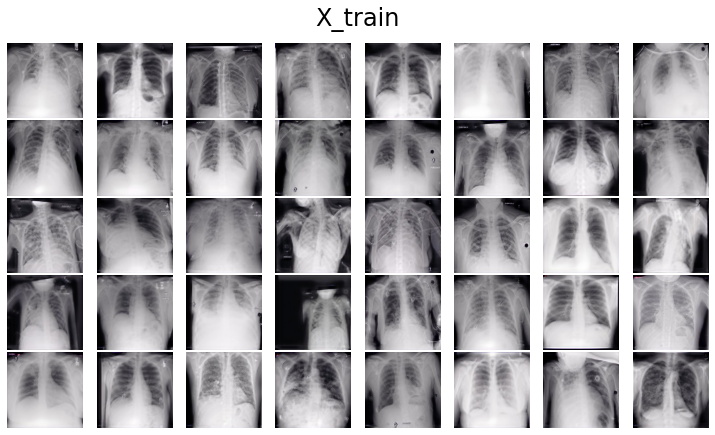

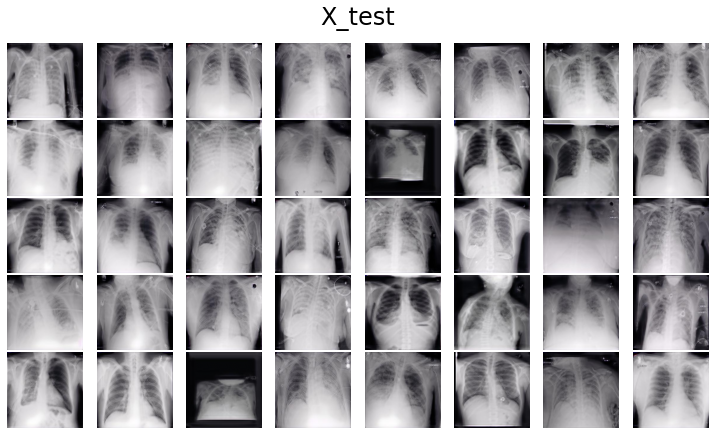

In [18]:
plot_images(Pneumonia_x_train, 'X_train')
plot_images(Pneumonia_x_test, 'X_test')
# y_train and y_test contain class lables 0 and 1 representing COVID and NonCOVID for X_train and X_test

### Importing the Model

In [19]:
XceptionModel = Xception(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = XceptionModel.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model = Model(inputs=XceptionModel.input, outputs=outputs)

for layer in XceptionModel.layers:
    layer.trainable = False

model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

83697664/83683744 [==============================] - 1s 0us/step


In [20]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                             

In [21]:
train_augmented = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

### Training!

In [22]:
history = model.fit(train_augmented.flow(X_train, y_train, batch_size=32),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 32,
                    steps_per_epoch=len(X_train) / 32,
                    epochs=250)

Epoch 1/250
25/25 [==============================] - 22s 424ms/step - loss: 0.8835 - accuracy: 0.7538 - val_loss: 0.9848 - val_accuracy: 0.7750
Epoch 2/250
25/25 [==============================] - 9s 377ms/step - loss: 0.6896 - accuracy: 0.8150 - val_loss: 0.6291 - val_accuracy: 0.8650
Epoch 3/250
25/25 [==============================] - 16s 665ms/step - loss: 0.7831 - accuracy: 0.8125 - val_loss: 1.0405 - val_accuracy: 0.7950
Epoch 4/250
25/25 [==============================] - 10s 377ms/step - loss: 0.5016 - accuracy: 0.8662 - val_loss: 0.5521 - val_accuracy: 0.8700
Epoch 5/250
25/25 [==============================] - 10s 379ms/step - loss: 0.6715 - accuracy: 0.8413 - val_loss: 0.9840 - val_accuracy: 0.8400
Epoch 6/250
25/25 [==============================] - 14s 550ms/step - loss: 0.6839 - accuracy: 0.8487 - val_loss: 0.7187 - val_accuracy: 0.8550
Epoch 7/250
25/25 [==============================] - 10s 399ms/step - loss: 0.7313 - accuracy: 0.8525 - val_loss: 1.8452 - val_accuracy: 

### Model export

In [23]:
model.save('/content/Xception_chest.h5')

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


In [24]:
model.save_weights('/content/Pneumonia_Xception_chest_weights.hdf5')

In [25]:
model = load_model('/content/Xception_chest.h5')

### Results and analysis

In [26]:
y_pred = model.predict(X_test, batch_size=batch_size)

In [27]:
y_pred[0:10]

array([[7.4788857e-01, 2.5211146e-01],
       [9.9969637e-01, 3.0365094e-04],
       [1.0000000e+00, 1.5270113e-24],
       [1.0000000e+00, 2.6829471e-37],
       [1.0000000e+00, 1.0330864e-15],
       [1.0000000e+00, 5.3117406e-12],
       [1.0000000e+00, 4.7251311e-21],
       [1.0000000e+00, 5.1105242e-11],
       [1.0000000e+00, 3.5522173e-12],
       [1.0000000e+00, 3.9478281e-14]], dtype=float32)

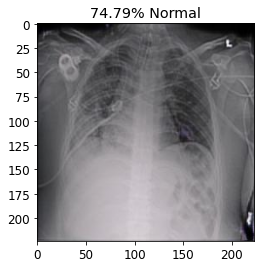

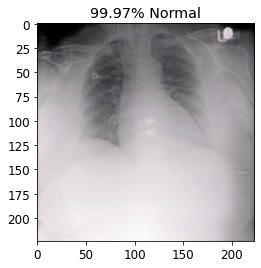

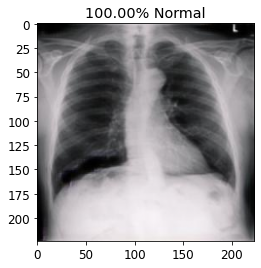

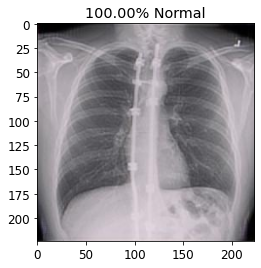

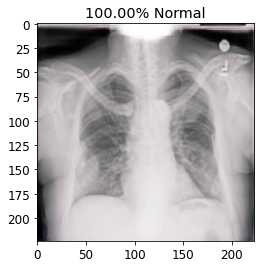

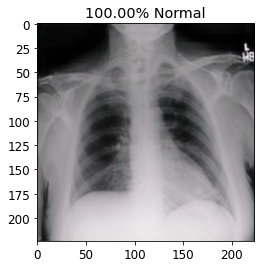

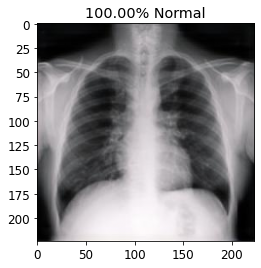

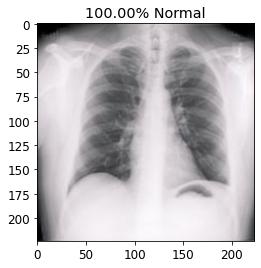

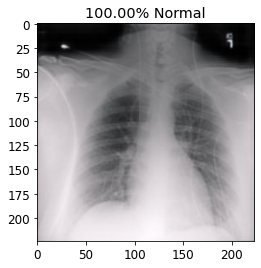

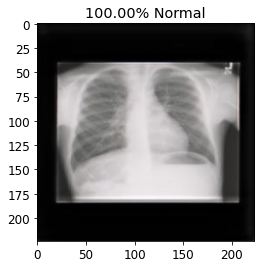

In [37]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
    if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% Pneumonia')
    else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% Normal')
    plt.imshow(X_test[index])
    plt.show()

In [29]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

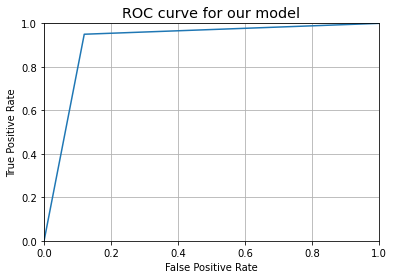

In [30]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


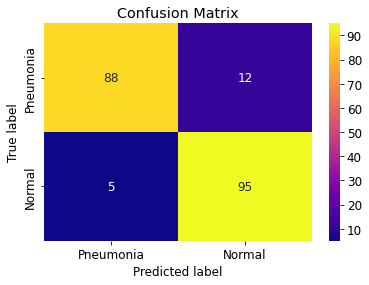

Confusion Matrix with Normalized Values


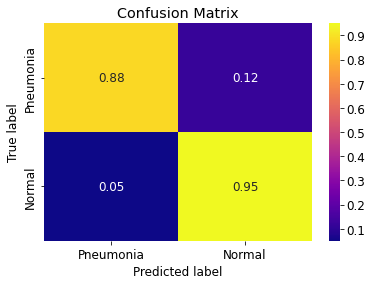

In [38]:
def plot_confusion_matrix(normalize):
    classes = ['Pneumonia','Normal']
    tick_marks = [0.5,1.5]
    cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
    sns.heatmap(cn,cmap='plasma',annot=True)
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [32]:
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       0.95      0.88      0.91       100
           1       0.89      0.95      0.92       100

    accuracy                           0.92       200
   macro avg       0.92      0.92      0.91       200
weighted avg       0.92      0.92      0.91       200



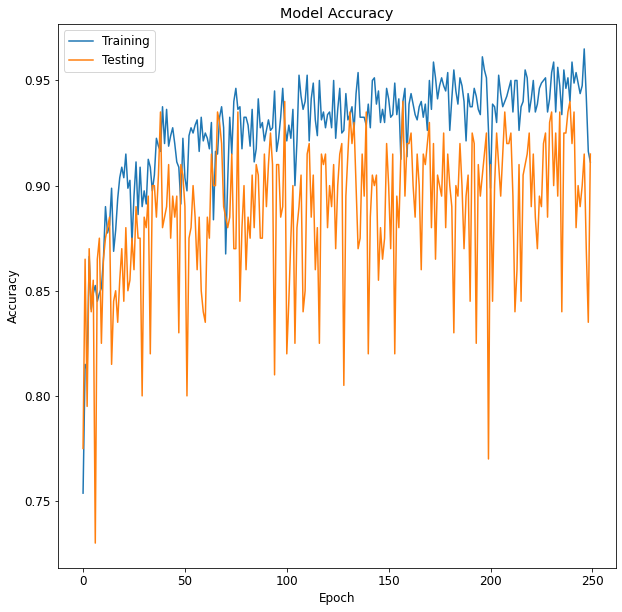

In [33]:
plt.figure(figsize=(10,10))

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('vgg_chest_accuracy.png')
plt.show()

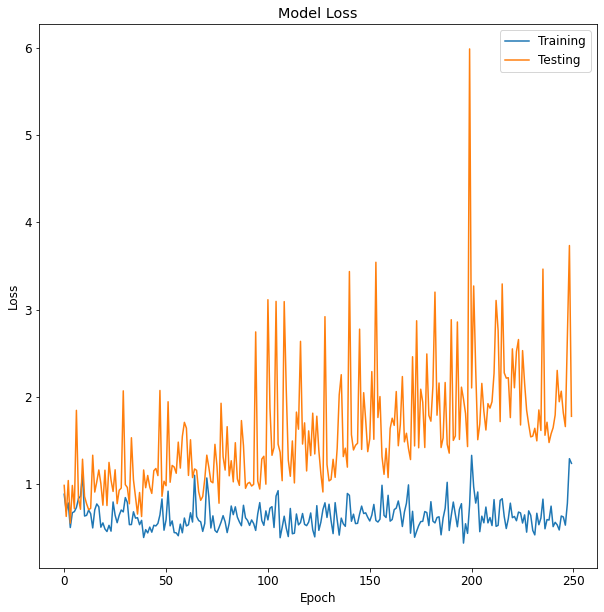

In [34]:
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('vgg_chest_loss.png')
plt.show()

#5- fold

Epoch 1/250
25/25 [==============================] - 30s 680ms/step - loss: 2.3372 - accuracy: 0.6513 - val_loss: 1.0092 - val_accuracy: 0.7750
Epoch 2/250
25/25 [==============================] - 17s 692ms/step - loss: 1.0067 - accuracy: 0.7850 - val_loss: 1.6112 - val_accuracy: 0.6950
Epoch 3/250
25/25 [==============================] - 15s 603ms/step - loss: 0.7094 - accuracy: 0.8375 - val_loss: 0.4741 - val_accuracy: 0.8350
Epoch 4/250
25/25 [==============================] - 15s 601ms/step - loss: 0.6972 - accuracy: 0.8375 - val_loss: 0.6853 - val_accuracy: 0.8400
Epoch 5/250
25/25 [==============================] - 15s 597ms/step - loss: 0.6317 - accuracy: 0.8300 - val_loss: 1.1128 - val_accuracy: 0.7400
Epoch 6/250
25/25 [==============================] - 15s 600ms/step - loss: 0.6220 - accuracy: 0.8600 - val_loss: 0.7817 - val_accuracy: 0.8200
Epoch 7/250
25/25 [==============================] - 15s 597ms/step - loss: 0.4949 - accuracy: 0.8700 - val_loss: 0.6296 - val_accuracy:

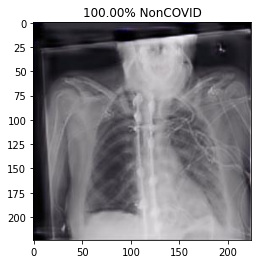

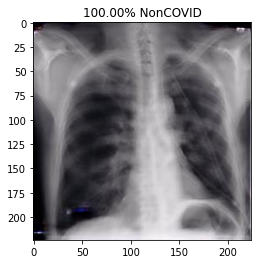

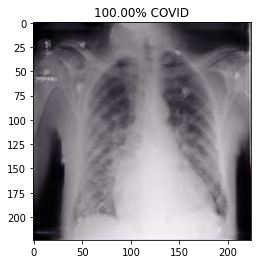

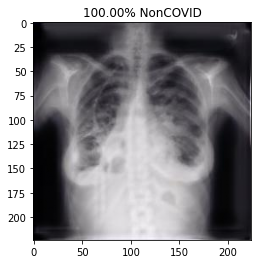

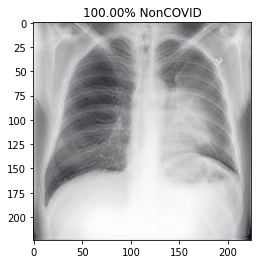

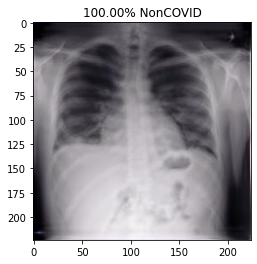

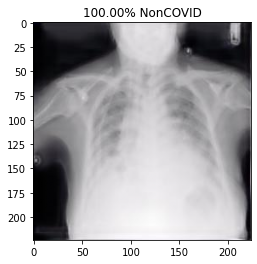

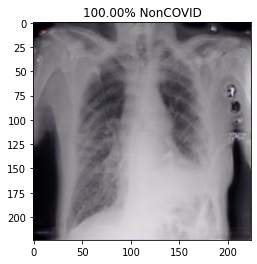

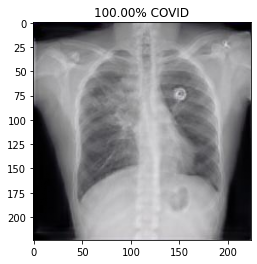

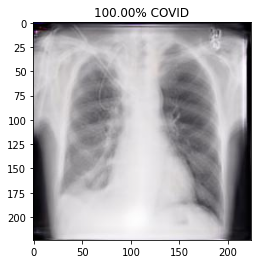

Confusion Matrix without Normalization


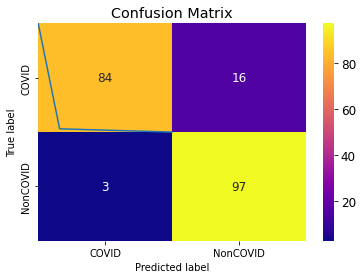

Confusion Matrix with Normalized Values


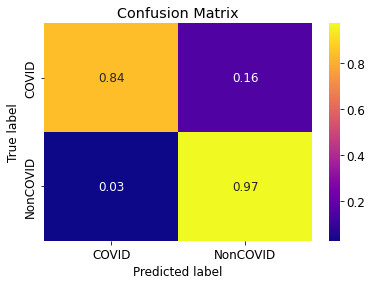

              precision    recall  f1-score   support

           0       0.97      0.84      0.90       100
           1       0.86      0.97      0.91       100

    accuracy                           0.91       200
   macro avg       0.91      0.91      0.90       200
weighted avg       0.91      0.91      0.90       200

Epoch 1/250
25/25 [==============================] - 19s 643ms/step - loss: 2.1804 - accuracy: 0.6538 - val_loss: 1.1345 - val_accuracy: 0.7800
Epoch 2/250
25/25 [==============================] - 15s 598ms/step - loss: 2.0321 - accuracy: 0.6862 - val_loss: 4.5937 - val_accuracy: 0.5750
Epoch 3/250
25/25 [==============================] - 15s 602ms/step - loss: 1.2360 - accuracy: 0.8087 - val_loss: 1.0532 - val_accuracy: 0.8100
Epoch 4/250
25/25 [==============================] - 15s 595ms/step - loss: 0.6537 - accuracy: 0.8525 - val_loss: 0.5711 - val_accuracy: 0.8650
Epoch 5/250
25/25 [==============================] - 15s 602ms/step - loss: 0.5998 - accuracy: 0.

In [ ]:
fold_no = 1
batch_size = 5
epochs = 25

acc_per_fold = []
perf_per_fold = []

# Define the K-fold Cross Validator
kfold = KFold(n_splits=5, shuffle=True)

for train, test in kfold.split(inputs, targets):
    
    #Create Model
  XceptionModel = Xception(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

  outputs = XceptionModel.output
  outputs = Flatten(name="flatten")(outputs)
  outputs = Dropout(0.5)(outputs)
  outputs = Dense(2, activation="softmax")(outputs)

  model = Model(inputs=XceptionModel.input, outputs=outputs)

  for layer in XceptionModel.layers:
    layer.trainable = False

  model.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
  )
    
  train_augmented = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
  )
  history = model.fit(train_augmented.flow(inputs[train], targets[train], batch_size=32),
                    validation_data=(inputs[test], targets[test]),
                    validation_steps=len(inputs[test]) / 32,
                    steps_per_epoch=len(inputs[train]) / 32,
                    epochs=250)
  y_pred = model.predict(inputs[test], batch_size=batch_size)
  prediction=y_pred[0:10]
  for index, probability in enumerate(prediction):
    if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% Pneumonia')
    else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% Normal')
    plt.imshow(inputs[test][index])
    plt.show()
  # Convert to Binary classes
  y_pred_bin = np.argmax(y_pred, axis=1)
  y_test_bin = np.argmax(targets[test], axis=1)
  
  
  fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
  plt.plot(fpr, tpr)
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.0])
  plt.rcParams['font.size'] = 12
  plt.title('ROC curve for our model')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.grid(True)


  def plot_confusion_matrix(normalize):
    classes = ['Pneumonia','Normal']
    tick_marks = [0.5,1.5]
    cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
    sns.heatmap(cn,cmap='plasma',annot=True)
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

  print('Confusion Matrix without Normalization')
  plot_confusion_matrix(normalize=None)

  print('Confusion Matrix with Normalized Values')
  plot_confusion_matrix(normalize='true')


  print(classification_report(y_test_bin, y_pred_bin))

 
  
  

#EfficientNetB0

import model

In [44]:
EfficientNetB0Model = EfficientNetB0(weights="imagenet", include_top=False,
    input_tensor=Input(shape=(224, 224, 3)))

outputs = EfficientNetB0Model.output
outputs = Flatten(name="flatten")(outputs)
outputs = Dropout(0.5)(outputs)
outputs = Dense(2, activation="softmax")(outputs)

model2 = Model(inputs=EfficientNetB0Model.input, outputs=outputs)

for layer in EfficientNetB0Model.layers:
    layer.trainable = False

model2.compile(
        loss='categorical_crossentropy', 
        optimizer='adam', 
        metrics=['accuracy']
)

In [45]:
model2.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['input_3[0][0]']                
                                                                                                  
 normalization_1 (Normalization  (None, 224, 224, 3)  7          ['rescaling_1[0][0]']            
 )                                                                                                
                                                                                            

In [40]:
train_augmented = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
)

Training

In [47]:
history = model2.fit(train_augmented.flow(X_train, y_train, batch_size=32),
                    validation_data=(X_test, y_test),
                    validation_steps=len(X_test) / 32,
                    steps_per_epoch=len(X_train) / 32,
                    epochs=250)

Epoch 1/250
25/25 [==============================] - 19s 428ms/step - loss: 3.7148 - accuracy: 0.5188 - val_loss: 2.1903 - val_accuracy: 0.5000
Epoch 2/250
25/25 [==============================] - 9s 351ms/step - loss: 1.6482 - accuracy: 0.5250 - val_loss: 1.6518 - val_accuracy: 0.5000
Epoch 3/250
25/25 [==============================] - 10s 392ms/step - loss: 1.3691 - accuracy: 0.5025 - val_loss: 1.8977 - val_accuracy: 0.5000
Epoch 4/250
25/25 [==============================] - 9s 358ms/step - loss: 1.2426 - accuracy: 0.4675 - val_loss: 0.9482 - val_accuracy: 0.5000
Epoch 5/250
25/25 [==============================] - 9s 347ms/step - loss: 1.2603 - accuracy: 0.5000 - val_loss: 0.7130 - val_accuracy: 0.5000
Epoch 6/250
25/25 [==============================] - 9s 358ms/step - loss: 1.1592 - accuracy: 0.4913 - val_loss: 0.8139 - val_accuracy: 0.5000
Epoch 7/250
25/25 [==============================] - 9s 346ms/step - loss: 1.0759 - accuracy: 0.4925 - val_loss: 0.7071 - val_accuracy: 0.50

In [61]:
model2.save('/content/EfficientNetB0_chest.h5')

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


In [49]:
model2.save_weights('/content/EfficientNetB0_chest_weights.hdf5')

In [62]:
model2 = load_model('/content/EfficientNetB0_chest.h5')

Results and analysis

In [63]:
y_pred = model2.predict(X_test, batch_size=batch_size)

In [64]:
y_pred[0:10]

array([[7.4788857e-01, 2.5211146e-01],
       [9.9969637e-01, 3.0365094e-04],
       [1.0000000e+00, 1.5270113e-24],
       [1.0000000e+00, 2.6829471e-37],
       [1.0000000e+00, 1.0330864e-15],
       [1.0000000e+00, 5.3117406e-12],
       [1.0000000e+00, 4.7251311e-21],
       [1.0000000e+00, 5.1105242e-11],
       [1.0000000e+00, 3.5522173e-12],
       [1.0000000e+00, 3.9478281e-14]], dtype=float32)

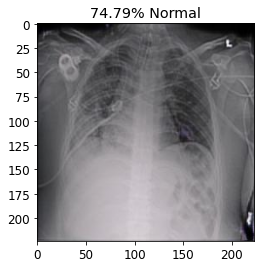

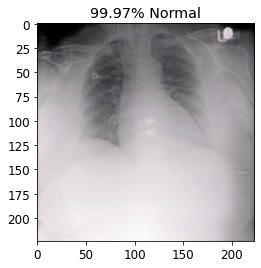

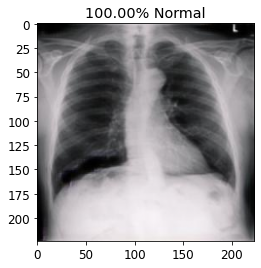

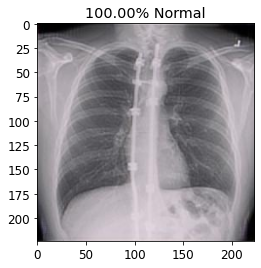

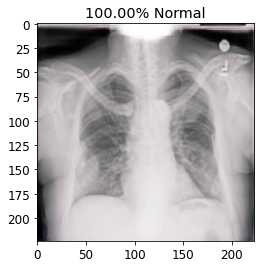

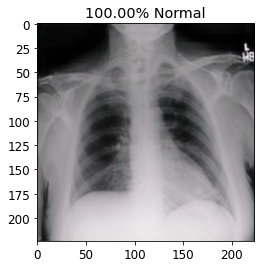

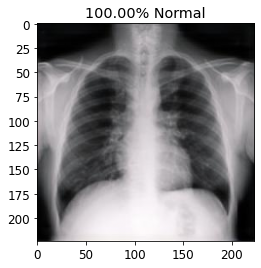

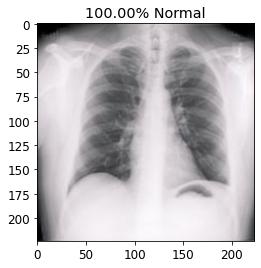

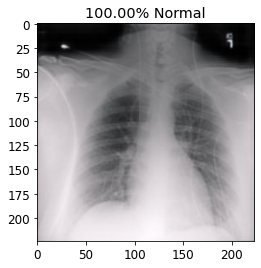

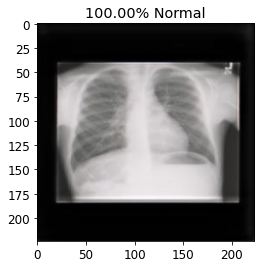

In [65]:
prediction=y_pred[0:10]
for index, probability in enumerate(prediction):
    if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% Pneumonia')
    else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% Normal')
    plt.imshow(X_test[index])
    plt.show()

In [68]:
# Convert to Binary classes
y_pred_bin = np.argmax(y_pred, axis=1)
y_test_bin = np.argmax(y_test, axis=1)

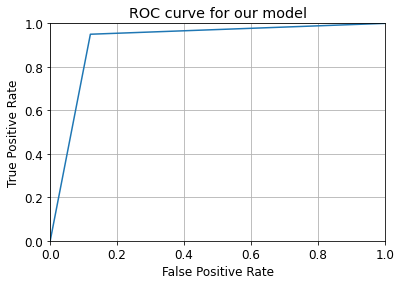

In [69]:
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for our model')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.grid(True)

Confusion Matrix without Normalization


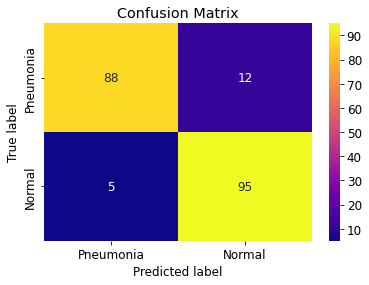

Confusion Matrix with Normalized Values


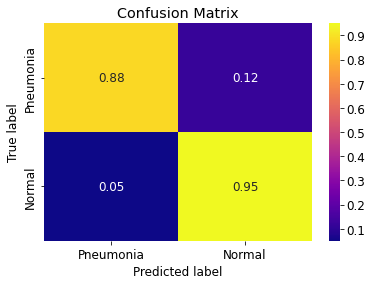

In [72]:
def plot_confusion_matrix(normalize):
    classes = ['Pneumonia','Normal']
    tick_marks = [0.5,1.5]
    cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
    sns.heatmap(cn,cmap='plasma',annot=True)
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

print('Confusion Matrix without Normalization')
plot_confusion_matrix(normalize=None)

print('Confusion Matrix with Normalized Values')
plot_confusion_matrix(normalize='true')

In [73]:
print(classification_report(y_test_bin, y_pred_bin))

              precision    recall  f1-score   support

           0       0.95      0.88      0.91       100
           1       0.89      0.95      0.92       100

    accuracy                           0.92       200
   macro avg       0.92      0.92      0.91       200
weighted avg       0.92      0.92      0.91       200



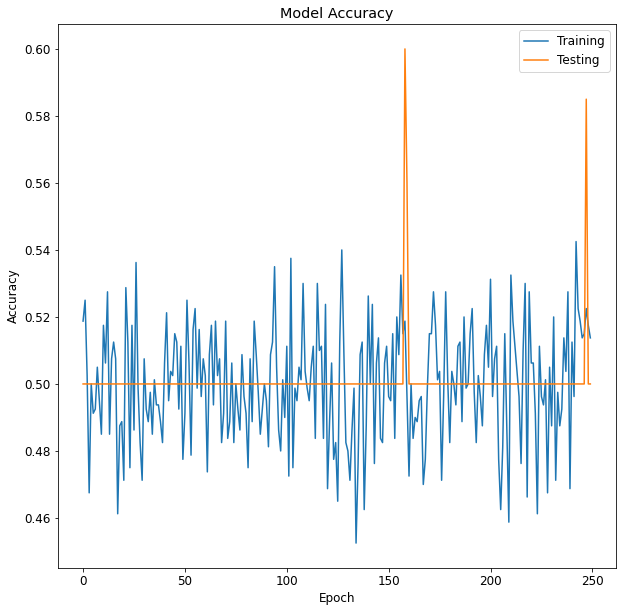

In [74]:
plt.figure(figsize=(10,10))

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('vgg_chest_accuracy.png')
plt.show()

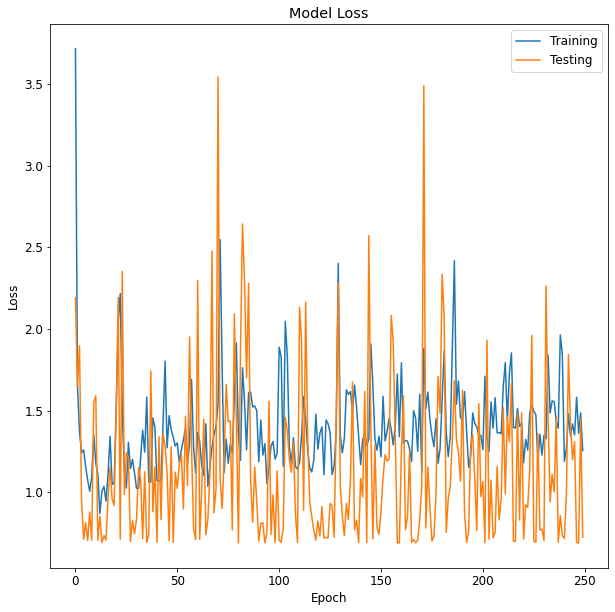

In [75]:
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.savefig('vgg_chest_loss.png')
plt.show()

5-fold

Epoch 1/250
25/25 [==============================] - 33s 476ms/step - loss: 2.1504 - accuracy: 0.4812 - val_loss: 0.7018 - val_accuracy: 0.4700
Epoch 2/250
25/25 [==============================] - 9s 345ms/step - loss: 0.9920 - accuracy: 0.4812 - val_loss: 0.7688 - val_accuracy: 0.5300
Epoch 3/250
25/25 [==============================] - 9s 350ms/step - loss: 1.3701 - accuracy: 0.4950 - val_loss: 2.0963 - val_accuracy: 0.5300
Epoch 4/250
25/25 [==============================] - 9s 345ms/step - loss: 1.1629 - accuracy: 0.4963 - val_loss: 1.1120 - val_accuracy: 0.4700
Epoch 5/250
25/25 [==============================] - 9s 353ms/step - loss: 0.9998 - accuracy: 0.5188 - val_loss: 0.9954 - val_accuracy: 0.4700
Epoch 6/250
25/25 [==============================] - 9s 349ms/step - loss: 1.1070 - accuracy: 0.4800 - val_loss: 0.7061 - val_accuracy: 0.4700
Epoch 7/250
25/25 [==============================] - 9s 358ms/step - loss: 1.2148 - accuracy: 0.5188 - val_loss: 1.0576 - val_accuracy: 0.530

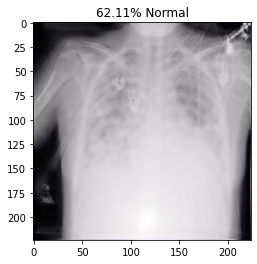

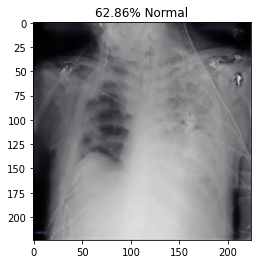

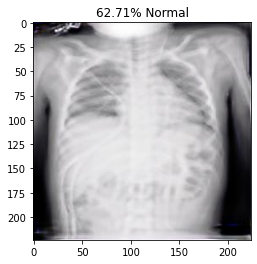

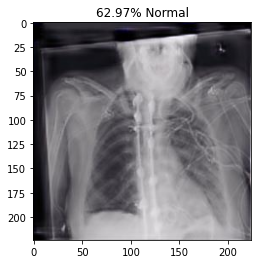

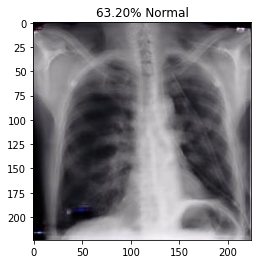

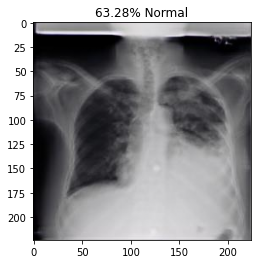

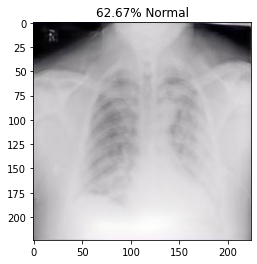

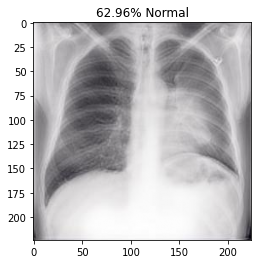

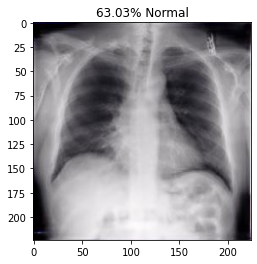

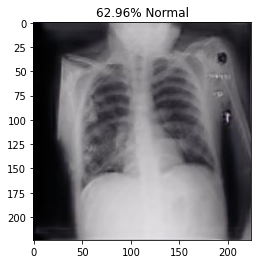

Confusion Matrix without Normalization


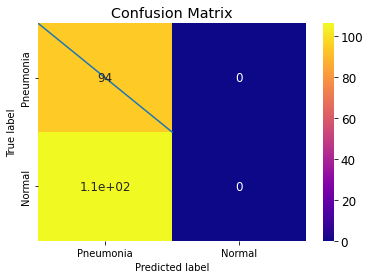

Confusion Matrix with Normalized Values


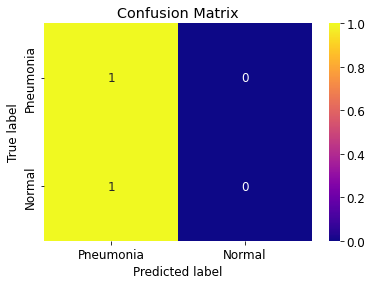

              precision    recall  f1-score   support

           0       0.47      1.00      0.64        94
           1       0.00      0.00      0.00       106

    accuracy                           0.47       200
   macro avg       0.23      0.50      0.32       200
weighted avg       0.22      0.47      0.30       200



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 1/250
25/25 [==============================] - 15s 413ms/step - loss: 4.6012 - accuracy: 0.5125 - val_loss: 3.5118 - val_accuracy: 0.5250
Epoch 2/250
25/25 [==============================] - 9s 356ms/step - loss: 1.7818 - accuracy: 0.4988 - val_loss: 0.9407 - val_accuracy: 0.4750
Epoch 3/250
25/25 [==============================] - 9s 348ms/step - loss: 1.1122 - accuracy: 0.5038 - val_loss: 0.7020 - val_accuracy: 0.4750
Epoch 4/250
25/25 [==============================] - 9s 357ms/step - loss: 1.1392 - accuracy: 0.4938 - val_loss: 0.8494 - val_accuracy: 0.4750
Epoch 5/250
25/25 [==============================] - 9s 360ms/step - loss: 1.1979 - accuracy: 0.5075 - val_loss: 1.5896 - val_accuracy: 0.4750
Epoch 6/250
25/25 [==============================] - 9s 355ms/step - loss: 1.3474 - accuracy: 0.5312 - val_loss: 1.4678 - val_accuracy: 0.4750
Epoch 7/250
25/25 [==============================] - 9s 354ms/step - loss: 1.0529 - accuracy: 0.5100 - val_loss: 0.7095 - val_accuracy: 0.525

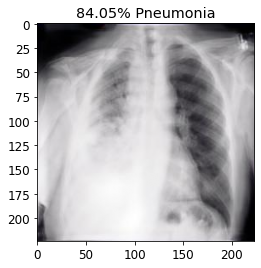

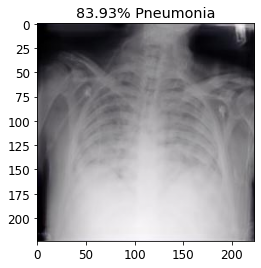

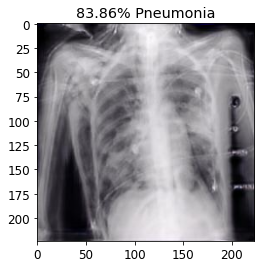

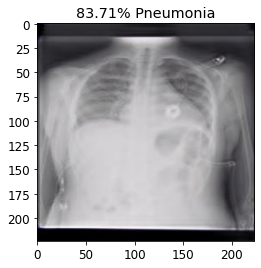

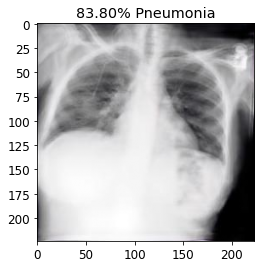

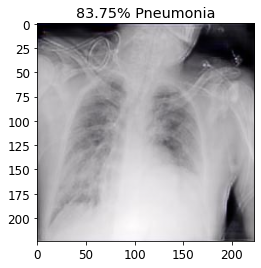

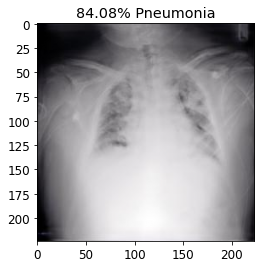

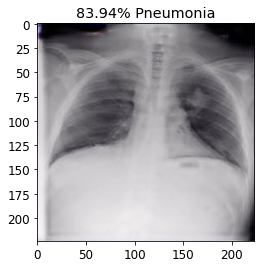

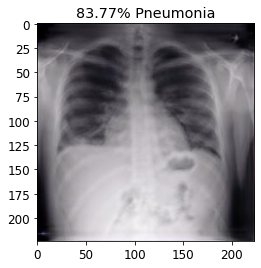

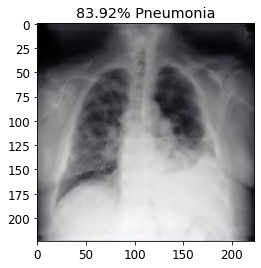

Confusion Matrix without Normalization


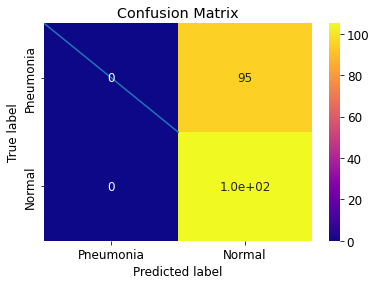

Confusion Matrix with Normalized Values


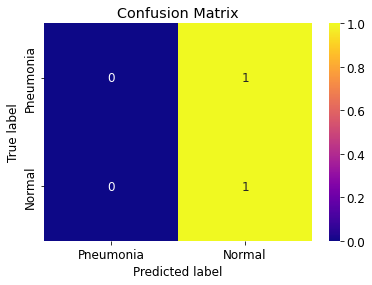

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        95
           1       0.53      1.00      0.69       105

    accuracy                           0.53       200
   macro avg       0.26      0.50      0.34       200
weighted avg       0.28      0.53      0.36       200



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 1/250
25/25 [==============================] - 15s 411ms/step - loss: 4.1573 - accuracy: 0.5013 - val_loss: 0.6896 - val_accuracy: 0.5400
Epoch 2/250
25/25 [==============================] - 9s 364ms/step - loss: 2.1482 - accuracy: 0.4975 - val_loss: 2.6566 - val_accuracy: 0.4600
Epoch 3/250
25/25 [==============================] - 9s 360ms/step - loss: 1.2234 - accuracy: 0.5038 - val_loss: 0.8038 - val_accuracy: 0.4600
Epoch 4/250
25/25 [==============================] - 9s 356ms/step - loss: 0.9943 - accuracy: 0.4950 - val_loss: 0.9398 - val_accuracy: 0.4600
Epoch 5/250
25/25 [==============================] - 9s 366ms/step - loss: 1.0190 - accuracy: 0.5138 - val_loss: 1.2395 - val_accuracy: 0.5400
Epoch 6/250
25/25 [==============================] - 9s 361ms/step - loss: 1.3196 - accuracy: 0.5175 - val_loss: 1.4303 - val_accuracy: 0.4600
Epoch 7/250
25/25 [==============================] - 9s 367ms/step - loss: 1.1642 - accuracy: 0.5063 - val_loss: 0.7743 - val_accuracy: 0.460

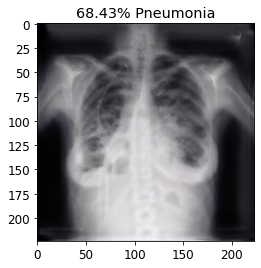

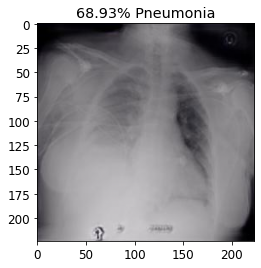

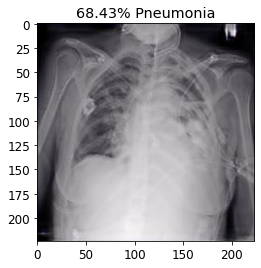

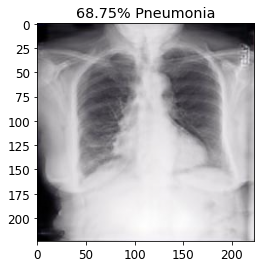

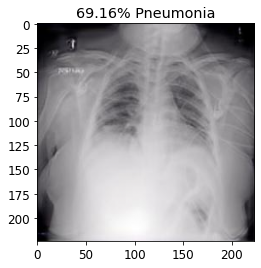

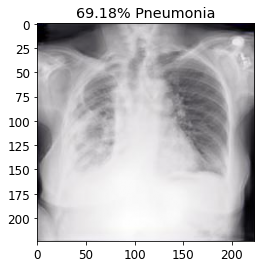

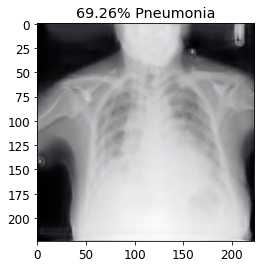

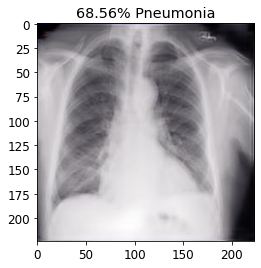

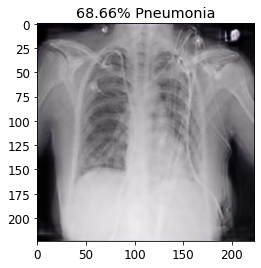

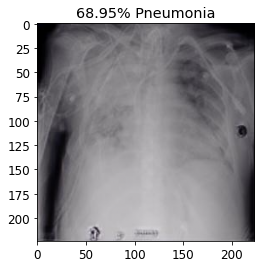

Confusion Matrix without Normalization


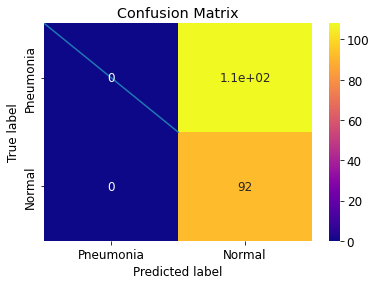

Confusion Matrix with Normalized Values


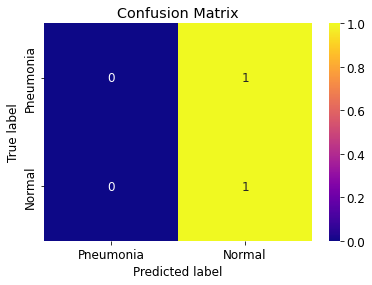

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00       108
           1       0.46      1.00      0.63        92

    accuracy                           0.46       200
   macro avg       0.23      0.50      0.32       200
weighted avg       0.21      0.46      0.29       200

Epoch 1/250
25/25 [==============================] - 15s 415ms/step - loss: 2.7692 - accuracy: 0.5125 - val_loss: 2.0711 - val_accuracy: 0.5250
Epoch 2/250
25/25 [==============================] - 9s 351ms/step - loss: 1.2555 - accuracy: 0.4863 - val_loss: 0.6913 - val_accuracy: 0.5250
Epoch 3/250
25/25 [==============================] - 9s 357ms/step - loss: 1.0960 - accuracy: 0.4950 - val_loss: 0.6950 - val_accuracy: 0.4750
Epoch 4/250
25/25 [==============================] - 9s 365ms/step - loss: 1.0388 - accuracy: 0.5188 - val_loss: 0.7209 - val_accuracy: 0.4750
Epoch 5/250
25/25 [==============================] - 9s 357ms/step - loss: 1.0229 - accuracy: 0.5088

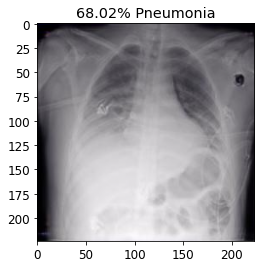

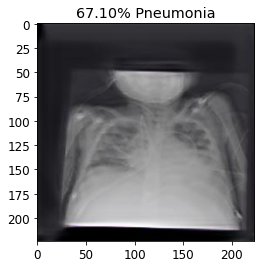

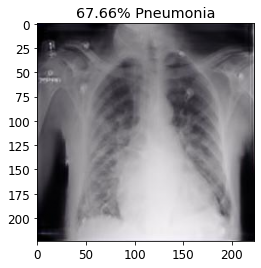

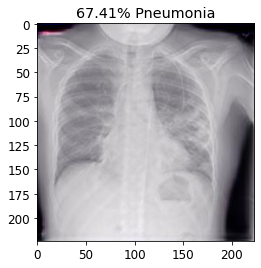

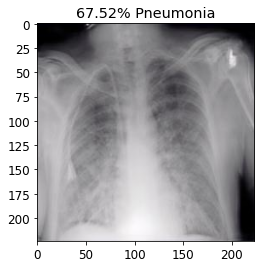

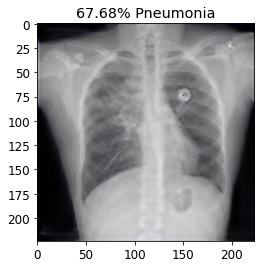

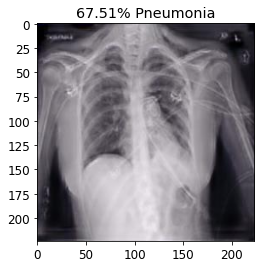

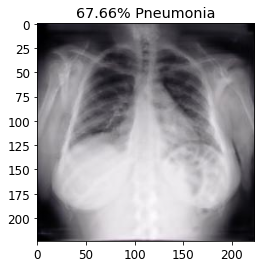

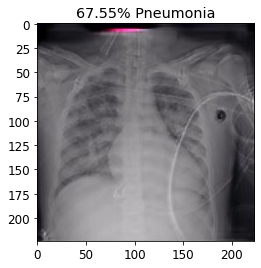

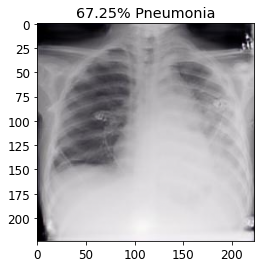

Confusion Matrix without Normalization


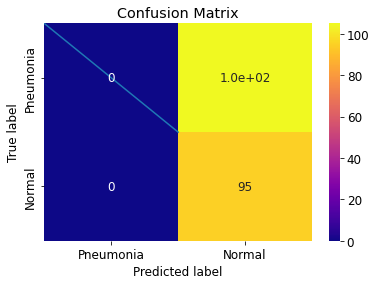

Confusion Matrix with Normalized Values


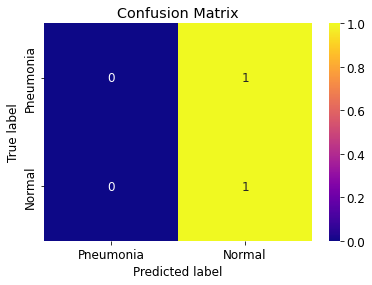

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00       105
           1       0.47      1.00      0.64        95

    accuracy                           0.48       200
   macro avg       0.24      0.50      0.32       200
weighted avg       0.23      0.47      0.31       200

Epoch 1/250
25/25 [==============================] - 16s 424ms/step - loss: 1.9086 - accuracy: 0.5200 - val_loss: 0.7958 - val_accuracy: 0.5100
Epoch 2/250
25/25 [==============================] - 9s 360ms/step - loss: 1.0501 - accuracy: 0.5412 - val_loss: 1.1300 - val_accuracy: 0.5100
Epoch 3/250
25/25 [==============================] - 9s 366ms/step - loss: 1.2654 - accuracy: 0.5150 - val_loss: 2.0704 - val_accuracy: 0.4900
Epoch 4/250
25/25 [==============================] - 9s 372ms/step - loss: 1.4727 - accuracy: 0.4950 - val_loss: 1.1987 - val_accuracy: 0.5100
Epoch 5/250
25/25 [==============================] - 9s 376ms/step - loss: 0.9649 - accuracy: 0.4812

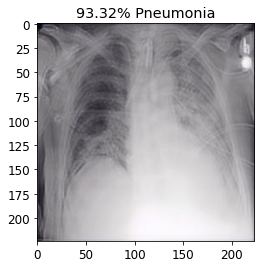

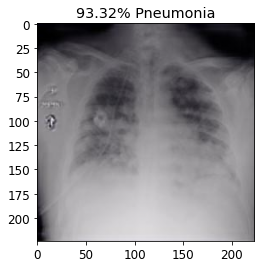

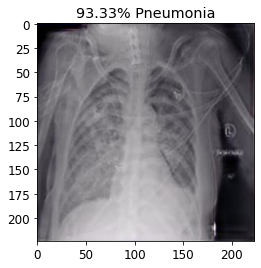

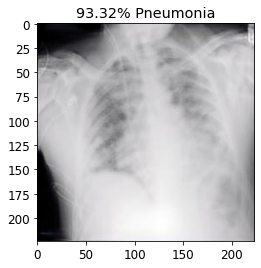

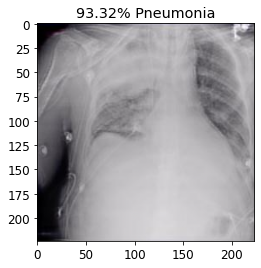

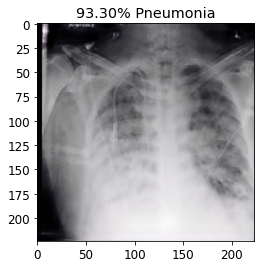

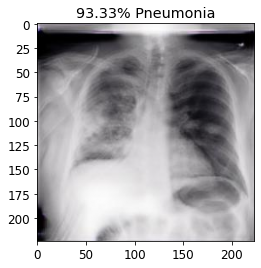

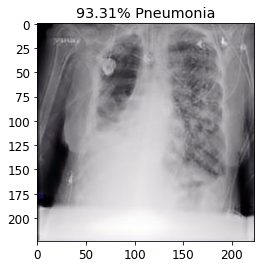

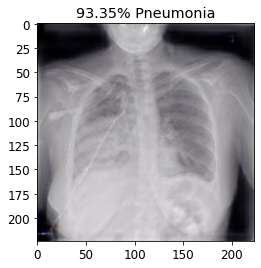

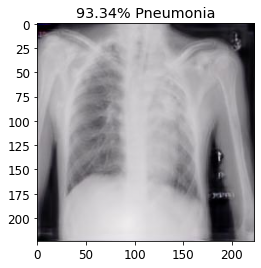

Confusion Matrix without Normalization


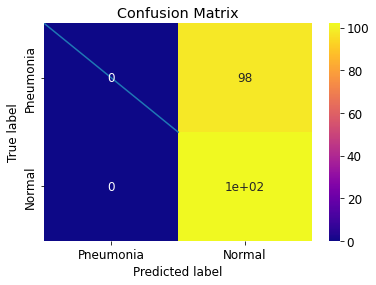

Confusion Matrix with Normalized Values


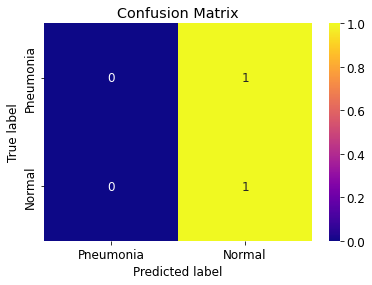

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        98
           1       0.51      1.00      0.68       102

    accuracy                           0.51       200
   macro avg       0.26      0.50      0.34       200
weighted avg       0.26      0.51      0.34       200



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [11]:
fold_no = 1
batch_size = 5
epochs = 25

acc_per_fold = []
perf_per_fold = []

# Define the K-fold Cross Validator
kfold = KFold(n_splits=5, shuffle=True)

for train, test in kfold.split(inputs, targets):
    
  EfficientNetB0Model = EfficientNetB0(weights="imagenet", include_top=False,
  input_tensor=Input(shape=(224, 224, 3)))

  outputs = EfficientNetB0Model.output
  outputs = Flatten(name="flatten")(outputs)
  outputs = Dropout(0.5)(outputs)
  outputs = Dense(2, activation="softmax")(outputs)

  model2 = Model(inputs=EfficientNetB0Model.input, outputs=outputs)

  for layer in EfficientNetB0Model.layers:
      layer.trainable = False


  model2.compile(
            loss='categorical_crossentropy', 
            optimizer='adam', 
            metrics=['accuracy']
  )
  train_augmented = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True
  )
  history = model2.fit(train_augmented.flow(inputs[train], targets[train], batch_size=32),
                    validation_data=(inputs[test], targets[test]),
                    validation_steps=len(inputs[test]) / 32,
                    steps_per_epoch=len(inputs[train]) / 32,
                    epochs=250)
  y_pred = model2.predict(inputs[test], batch_size=batch_size)
  prediction=y_pred[0:10]
  for index, probability in enumerate(prediction):
    if probability[1] > 0.5:
        plt.title('%.2f' % (probability[1]*100) + '% Pneumonia')
    else:
        plt.title('%.2f' % ((1-probability[1])*100) + '% Normal')
    plt.imshow(inputs[test][index])
    plt.show()
  # Convert to Binary classes
  y_pred_bin = np.argmax(y_pred, axis=1)
  y_test_bin = np.argmax(targets[test], axis=1)
  
  
  fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_bin)
  plt.plot(fpr, tpr)
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.0])
  plt.rcParams['font.size'] = 12
  plt.title('ROC curve for our model')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.grid(True)


  def plot_confusion_matrix(normalize):
    classes = ['Pneumonia','Normal']
    tick_marks = [0.5,1.5]
    cn = confusion_matrix(y_test_bin, y_pred_bin,normalize=normalize)
    sns.heatmap(cn,cmap='plasma',annot=True)
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

  print('Confusion Matrix without Normalization')
  plot_confusion_matrix(normalize=None)

  print('Confusion Matrix with Normalized Values')
  plot_confusion_matrix(normalize='true')


  print(classification_report(y_test_bin, y_pred_bin))